In [1]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time

def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

In [2]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

In [3]:
def get_cameraman_tensor(sidelength):
    img = Image.open("starry_night_512.png")
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

In [4]:
class ImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_cameraman_tensor(sidelength)
        img = img.permute(1, 2, 0).contiguous()
        self.pixels = img.view(-1, img.shape[-1])
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):
        if idx > 0: raise IndexError

        return self.coords, self.pixels

In [5]:
cameraman = ImageFitting(256)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

img_siren = Siren(in_features=2, out_features=1, hidden_features=256,
                  hidden_layers=3, outermost_linear=True)
img_siren.cuda()

/opt/conda/lib/python3.11/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


NameError: name 'Siren' is not defined

In [6]:
import torch
import torch.nn as nn
import numpy as np
from collections import OrderedDict


class ReluLayer(nn.Module):
    """
    Linear layer followed by ReLU, with Kaiming initialization.
    Kept 'is_first' argument for API compatibility with SineLayer,
    but we don't need omega_0 here.
    """
    def __init__(self, in_features, out_features, bias=True, is_first=False):
        super().__init__()
        self.is_first = is_first
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        self.init_weights()

    def init_weights(self):
        # Kaiming (He) initialization for ReLU networks
        with torch.no_grad():
            nn.init.kaiming_uniform_(self.linear.weight, a=0.0, nonlinearity='relu')
            if self.linear.bias is not None:
                # small bias
                self.linear.bias.fill_(0.0)

    def forward(self, input):
        return torch.relu(self.linear(input))

    def forward_with_intermediate(self, input):
        # For visualization of activation distributions
        intermediate = self.linear(input)
        return torch.relu(intermediate), intermediate


class ReluNet(nn.Module):
    """
    ReLU MLP with the same interface as Siren:
    - in_features
    - hidden_features
    - hidden_layers (number of hidden layers)
    - out_features
    - outermost_linear: if True, final layer is linear, else final layer also has ReLU
    """
    def __init__(self, in_features, hidden_features, hidden_layers, out_features,
                 outermost_linear=False):
        super().__init__()

        net = []

        # First layer
        net.append(ReluLayer(in_features, hidden_features, is_first=True))

        # Hidden layers
        for _ in range(hidden_layers):
            net.append(ReluLayer(hidden_features, hidden_features, is_first=False))

        # Output layer
        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            with torch.no_grad():
                nn.init.kaiming_uniform_(final_linear.weight, a=0.0, nonlinearity='linear')
                if final_linear.bias is not None:
                    final_linear.bias.fill_(0.0)
            net.append(final_linear)
        else:
            # ReLU on output as well
            net.append(ReluLayer(hidden_features, out_features, is_first=False))

        self.net = nn.Sequential(*net)

    def forward(self, coords):
        # Same behavior as Siren: clone + requires_grad for input
        coords = coords.clone().detach().requires_grad_(True)
        output = self.net(coords)
        return output, coords

    def forward_with_activations(self, coords, retain_grad=False):
        """Returns model output + intermediate activations (like Siren)."""
        activations = OrderedDict()

        activation_count = 0
        x = coords.clone().detach().requires_grad_(True)
        activations['input'] = x

        for i, layer in enumerate(self.net):
            if isinstance(layer, ReluLayer):
                x, intermed = layer.forward_with_intermediate(x)

                if retain_grad:
                    x.retain_grad()
                    intermed.retain_grad()

                activations['_'.join((str(layer.__class__.__name__), "%d" % activation_count))] = intermed
                activation_count += 1
            else:
                # final linear layer, if outermost_linear=True
                x = layer(x)
                if retain_grad:
                    x.retain_grad()

            activations['_'.join((str(layer.__class__.__name__), "%d" % activation_count))] = x
            activation_count += 1

        return activations


In [7]:
cameraman = ImageFitting(256)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

img_relu = ReluNet(in_features=2, hidden_features=256,
                   hidden_layers=3, out_features=1,
                   outermost_linear=True)
img_relu.cuda()



ReluNet(
  (net): Sequential(
    (0): ReluLayer(
      (linear): Linear(in_features=2, out_features=256, bias=True)
    )
    (1): ReluLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): ReluLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): ReluLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (4): Linear(in_features=256, out_features=1, bias=True)
  )
)

Step 0, Total loss 0.218170


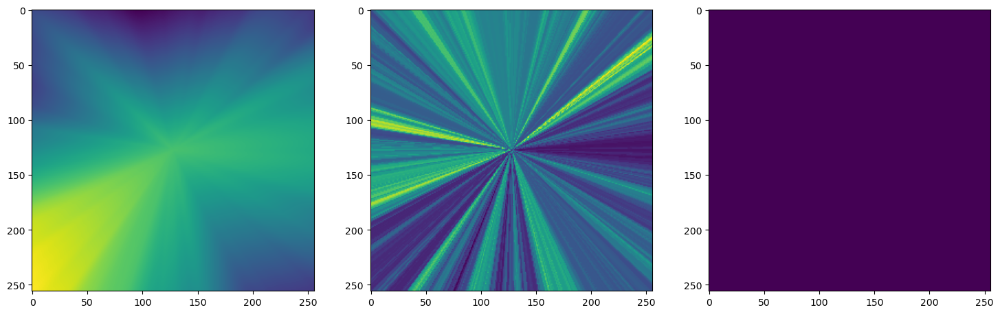

Step 10, Total loss 0.102874


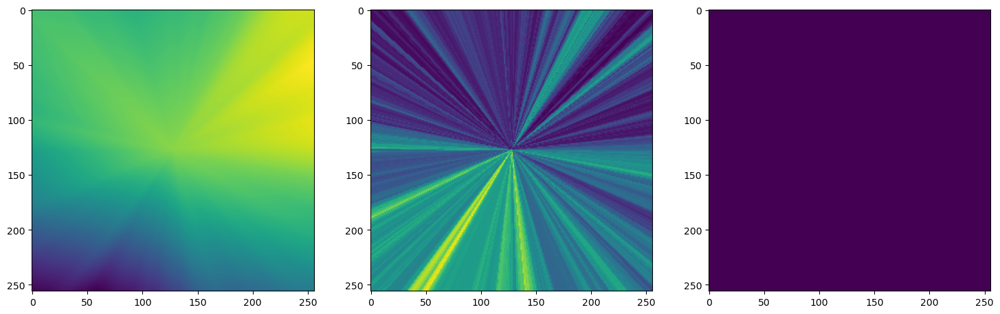

Step 20, Total loss 0.093141


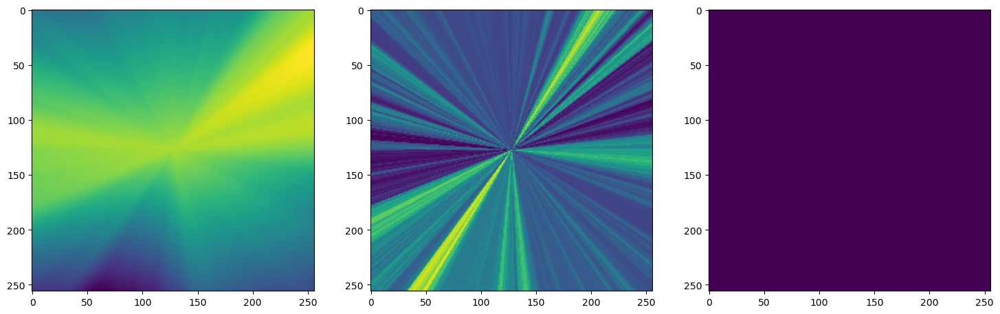

Step 30, Total loss 0.088395


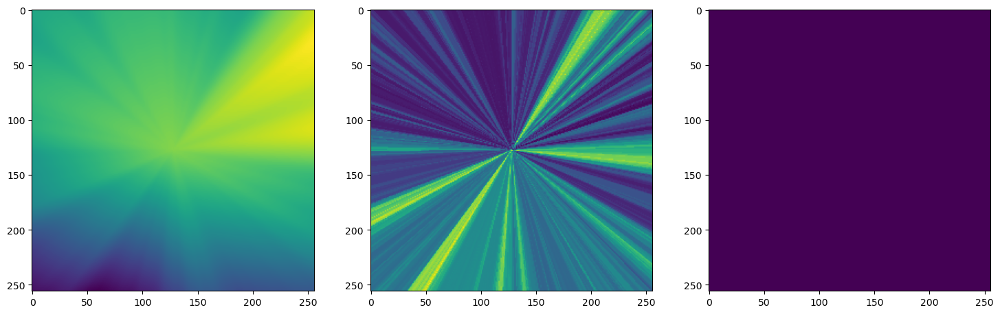

Step 40, Total loss 0.086456


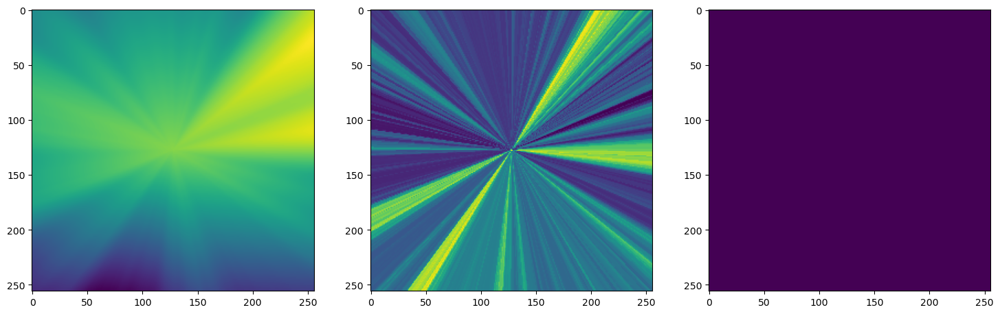

Step 50, Total loss 0.085590


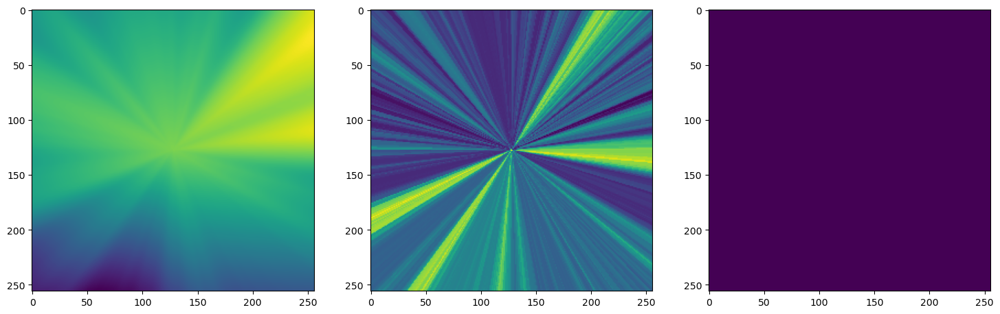

Step 60, Total loss 0.085080


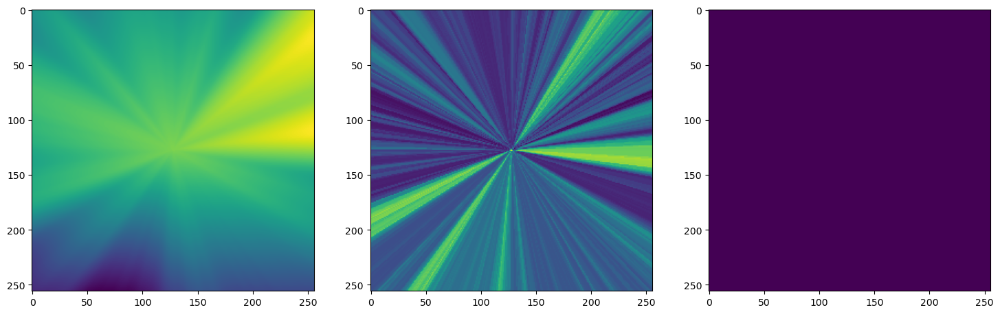

Step 70, Total loss 0.084738


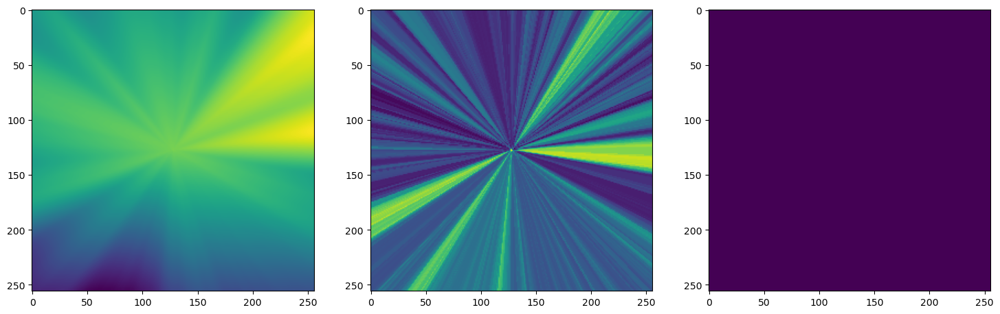

Step 80, Total loss 0.084491


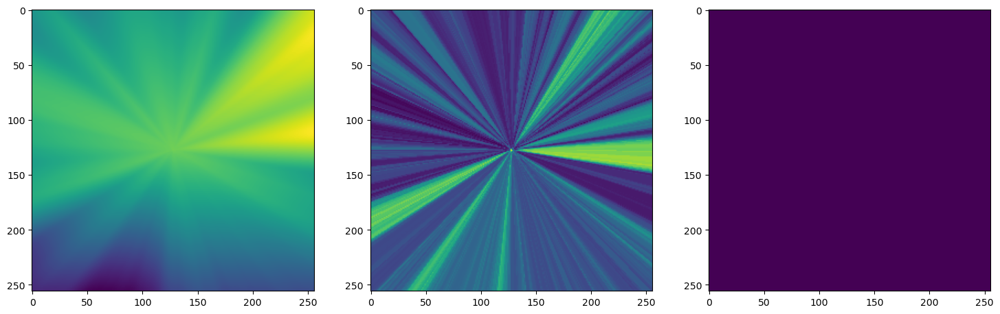

Step 90, Total loss 0.084302


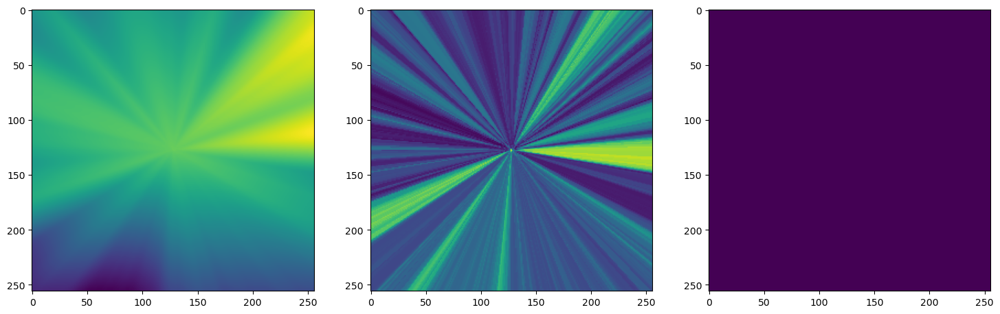

Step 100, Total loss 0.084143


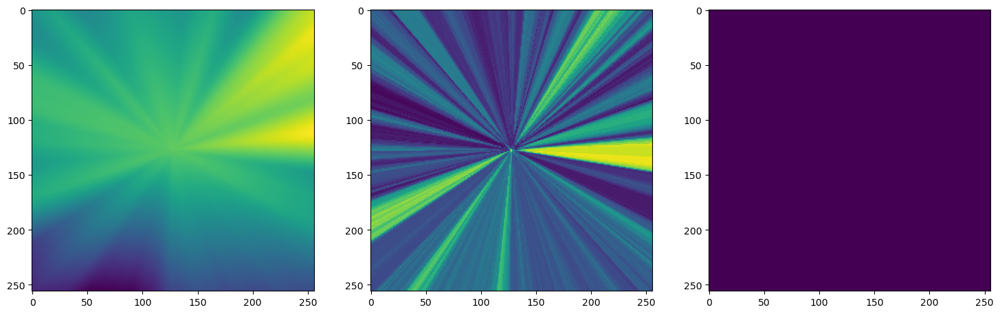

Step 110, Total loss 0.084000


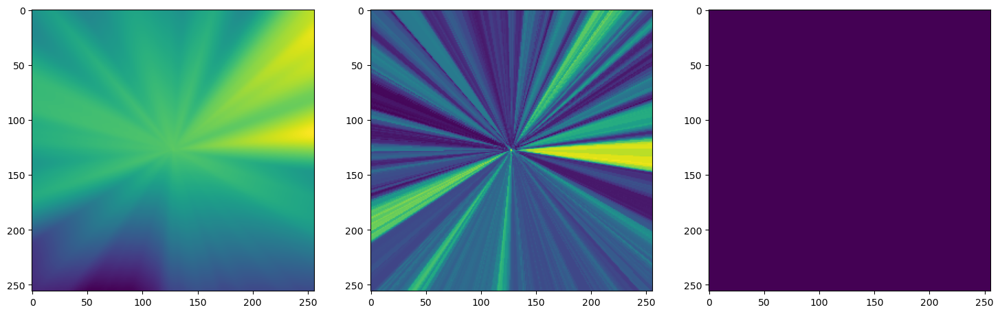

Step 120, Total loss 0.083874


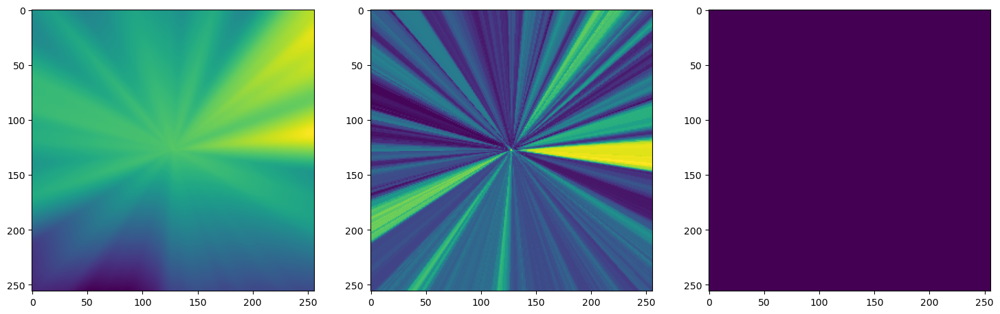

Step 130, Total loss 0.083769


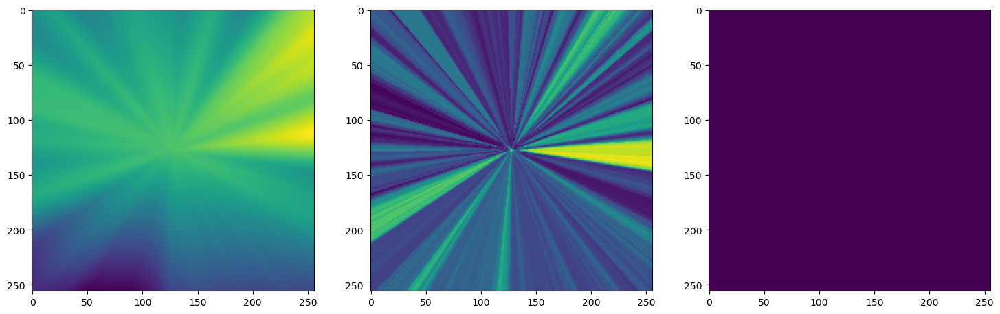

Step 140, Total loss 0.083676


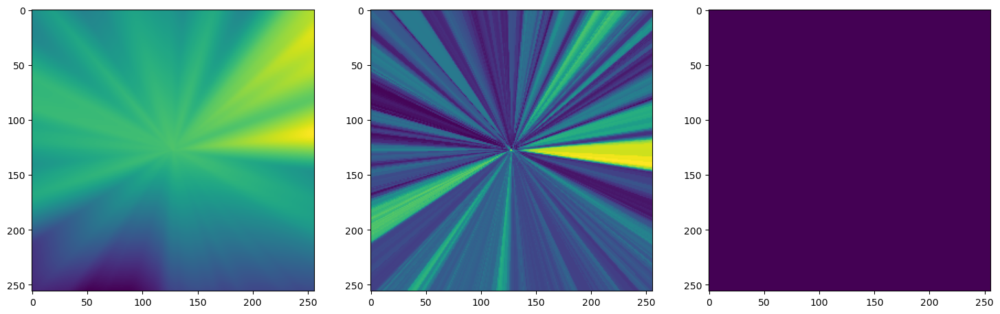

Step 150, Total loss 0.083584


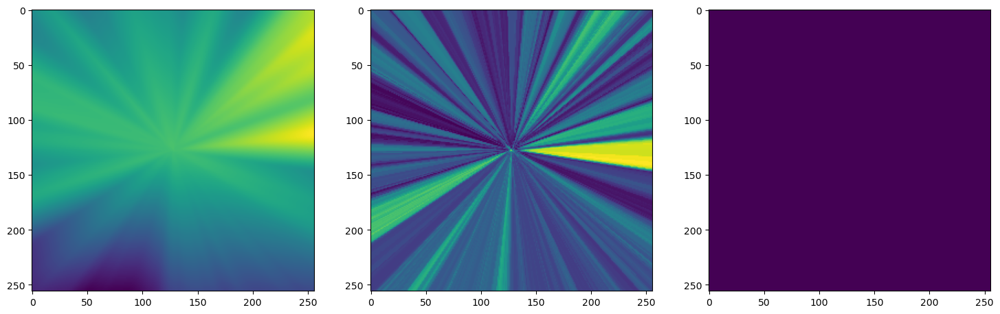

Step 160, Total loss 0.083487


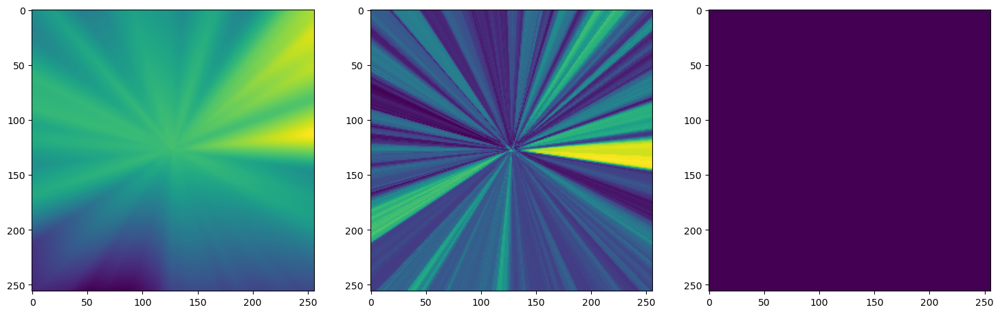

Step 170, Total loss 0.083387


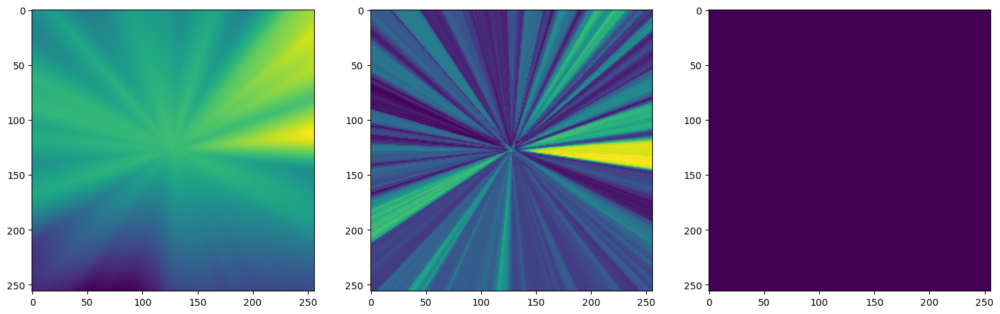

Step 180, Total loss 0.083284


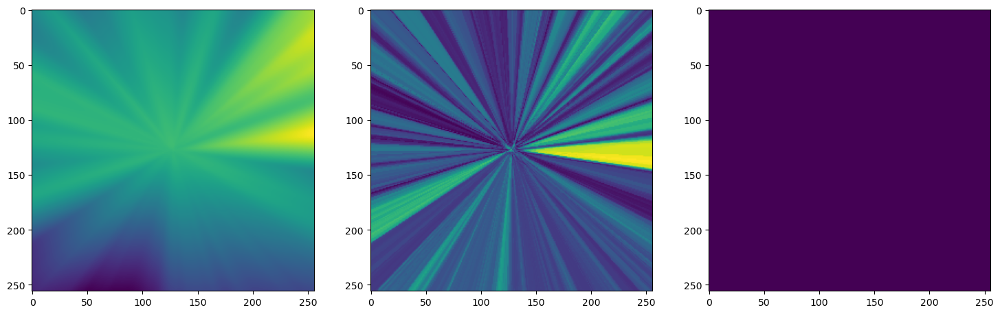

Step 190, Total loss 0.083189


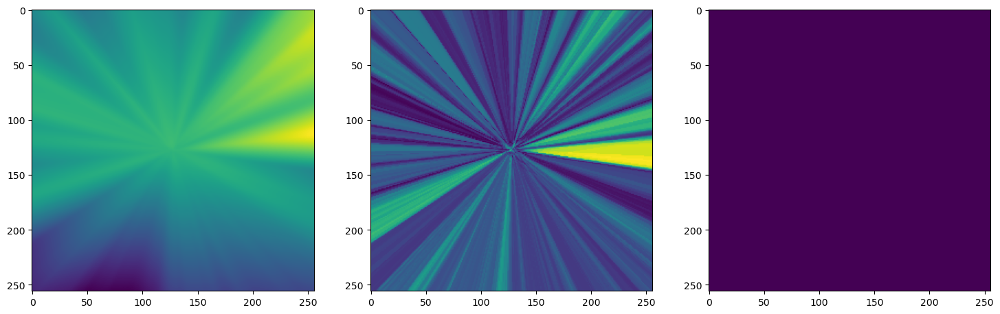

Step 200, Total loss 0.083100


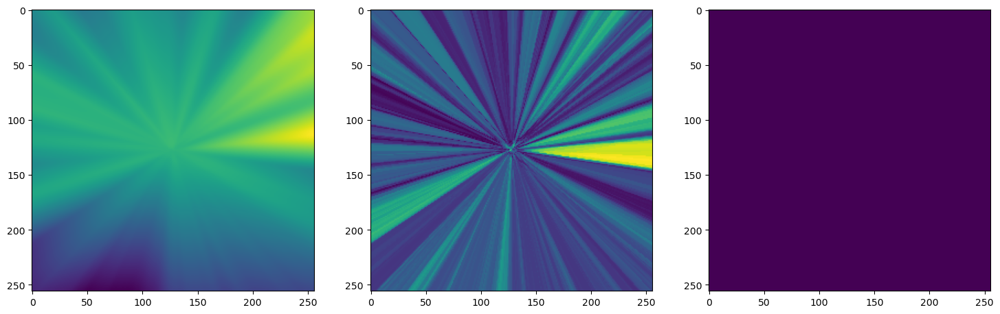

Step 210, Total loss 0.083012


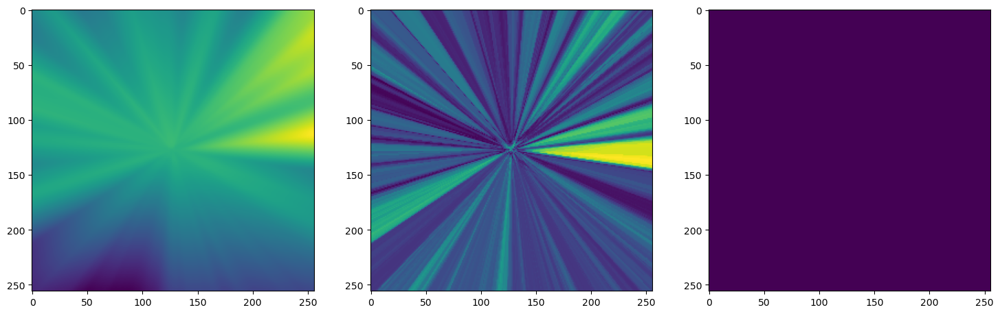

Step 220, Total loss 0.082926


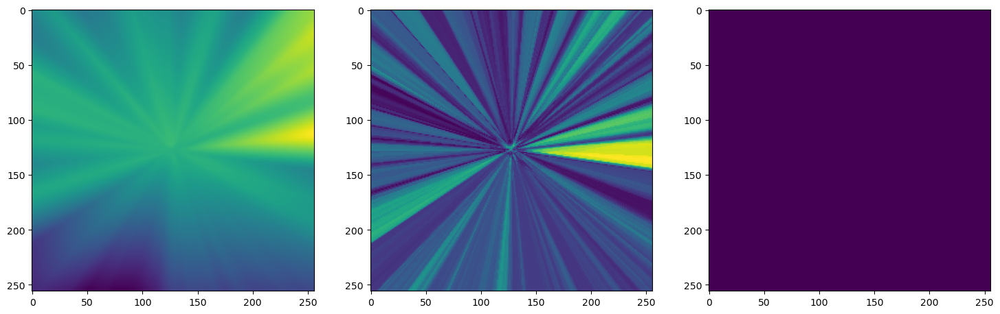

Step 230, Total loss 0.082838


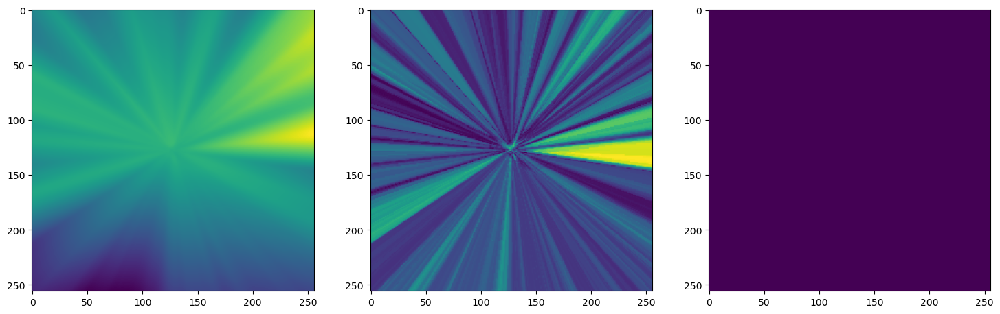

Step 240, Total loss 0.082749


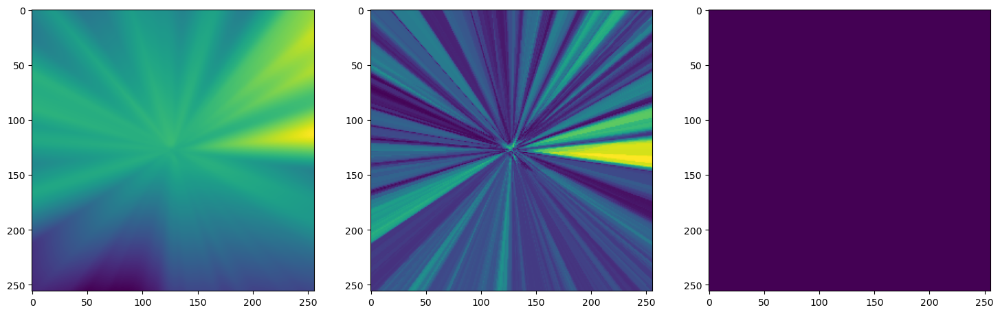

Step 250, Total loss 0.082659


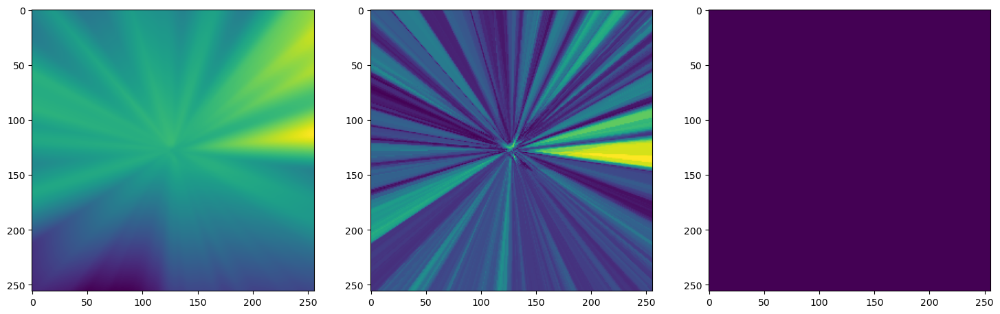

Step 260, Total loss 0.082564


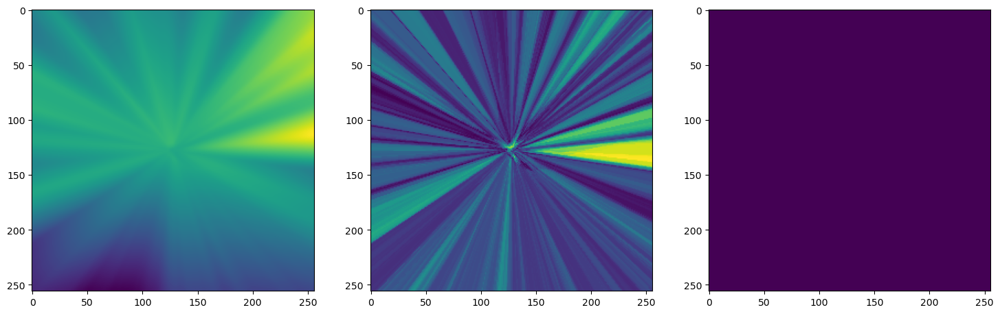

Step 270, Total loss 0.082463


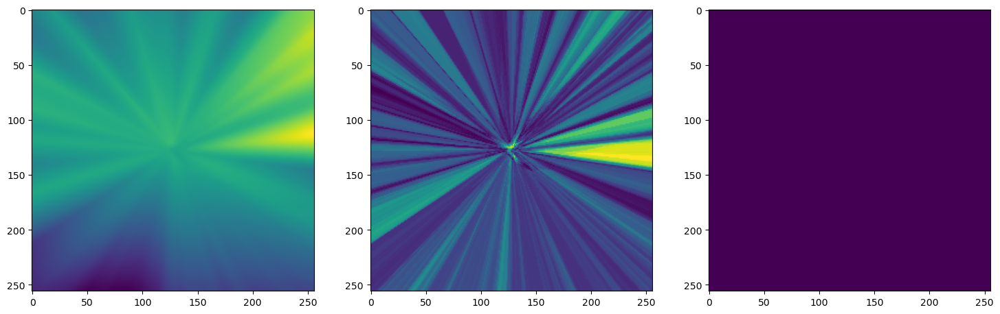

Step 280, Total loss 0.082366


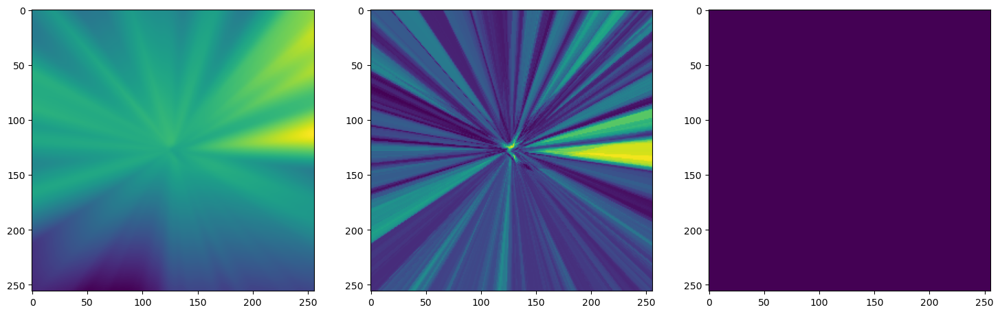

Step 290, Total loss 0.082268


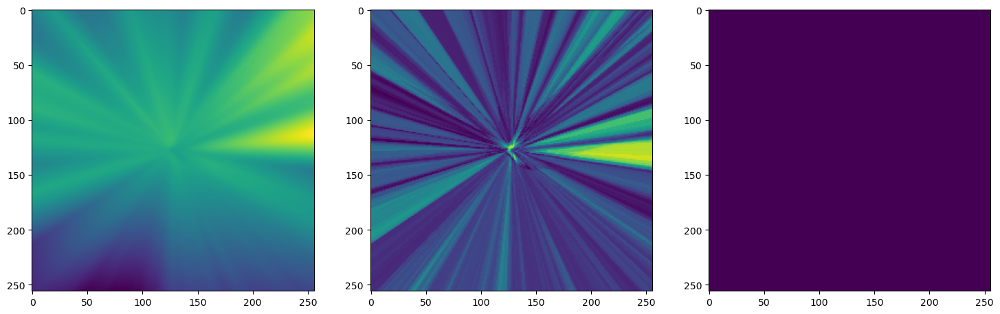

Step 300, Total loss 0.082169


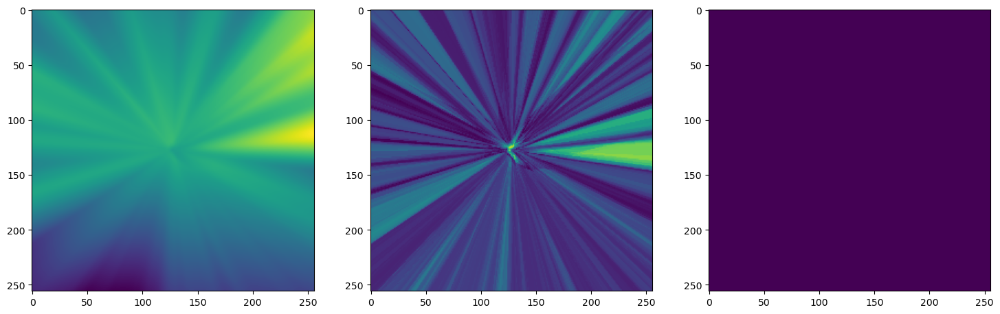

Step 310, Total loss 0.082072


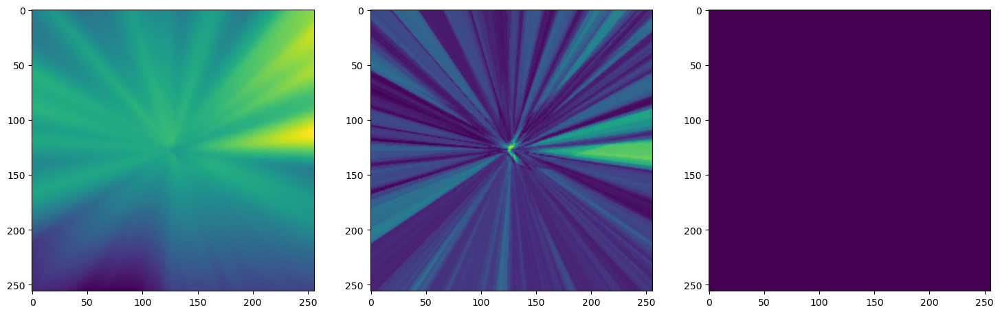

Step 320, Total loss 0.081972


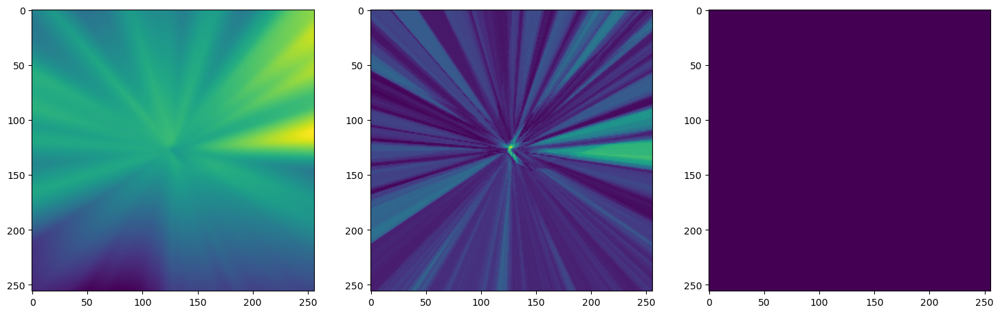

Step 330, Total loss 0.081861


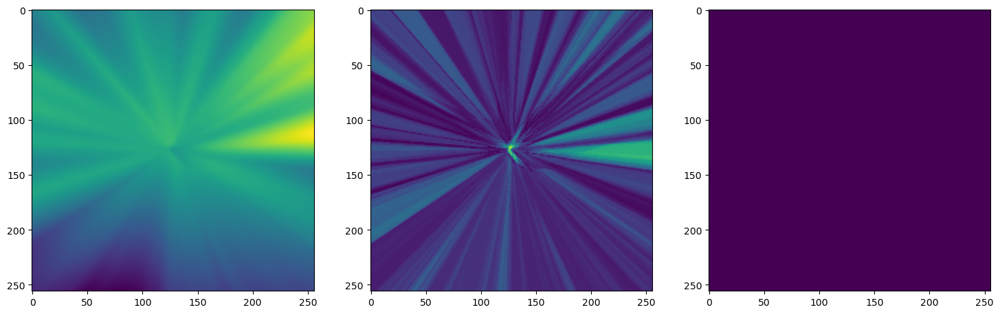

Step 340, Total loss 0.081741


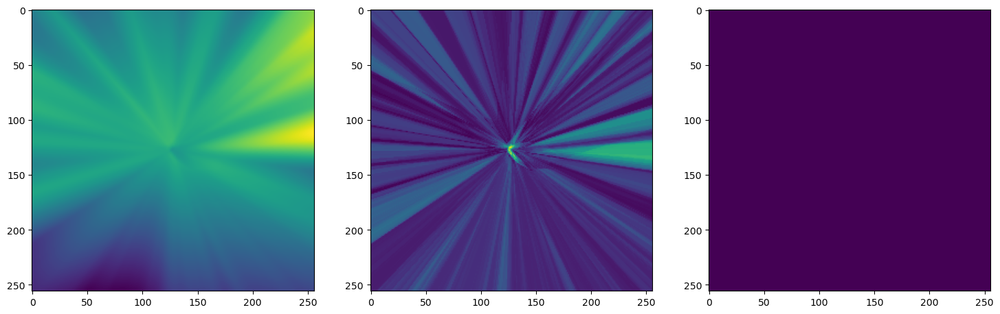

Step 350, Total loss 0.081611


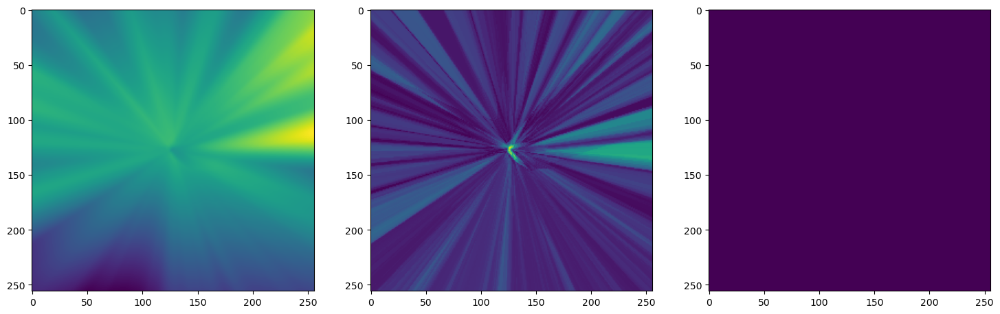

Step 360, Total loss 0.081462


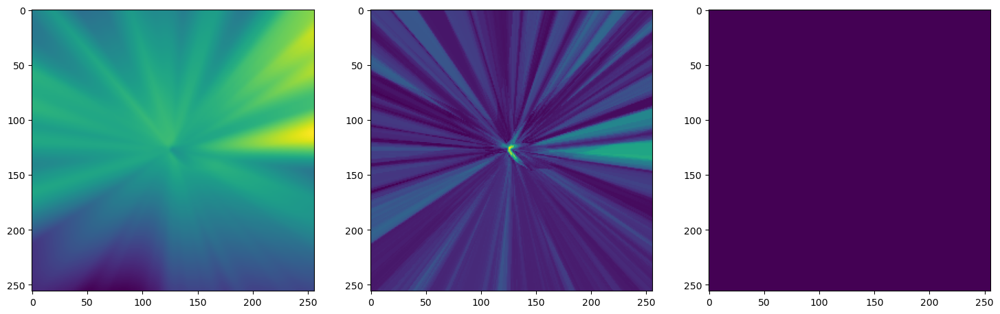

Step 370, Total loss 0.081291


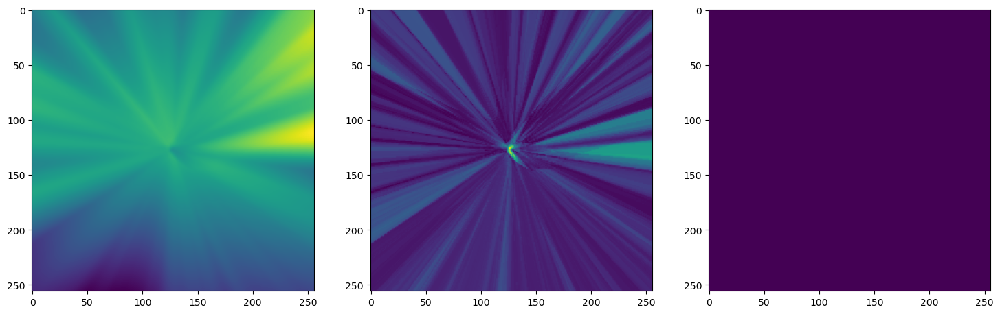

Step 380, Total loss 0.081104


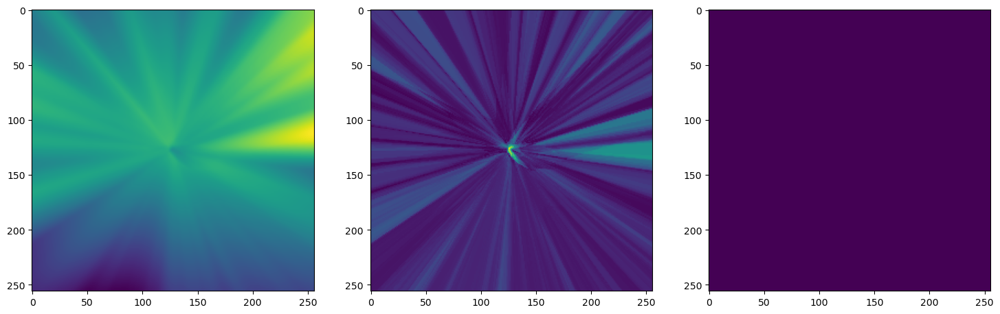

Step 390, Total loss 0.080882


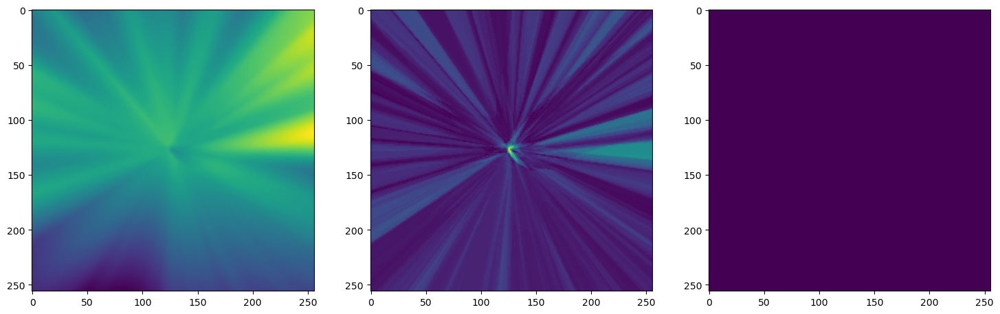

Step 400, Total loss 0.080605


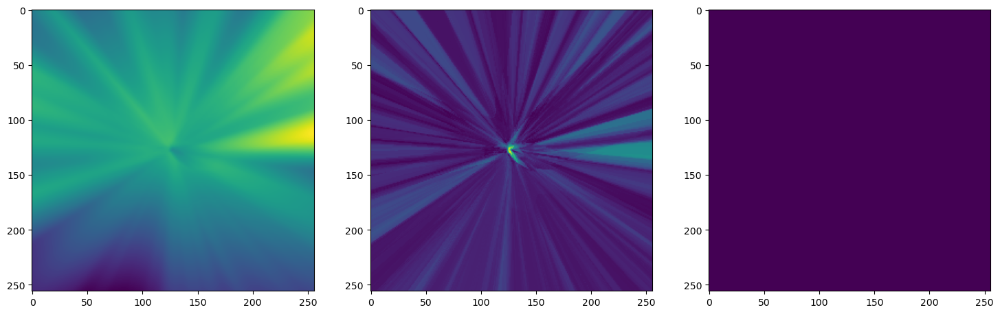

Step 410, Total loss 0.080290


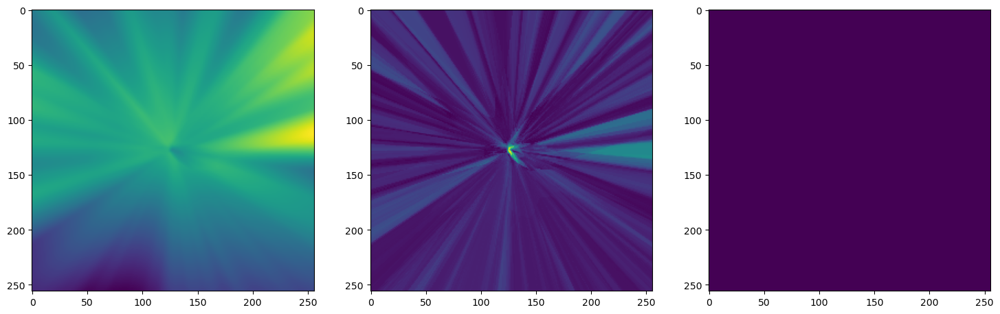

Step 420, Total loss 0.079962


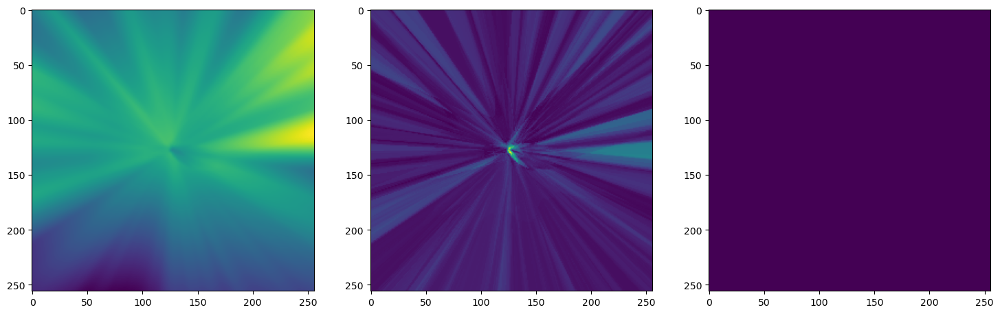

Step 430, Total loss 0.079593


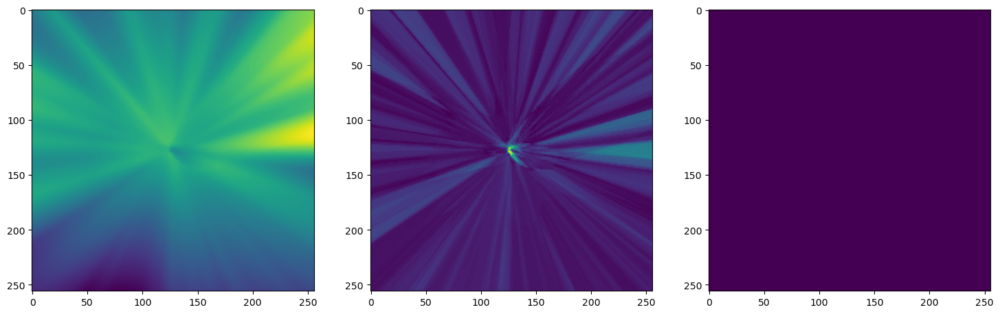

Step 440, Total loss 0.079148


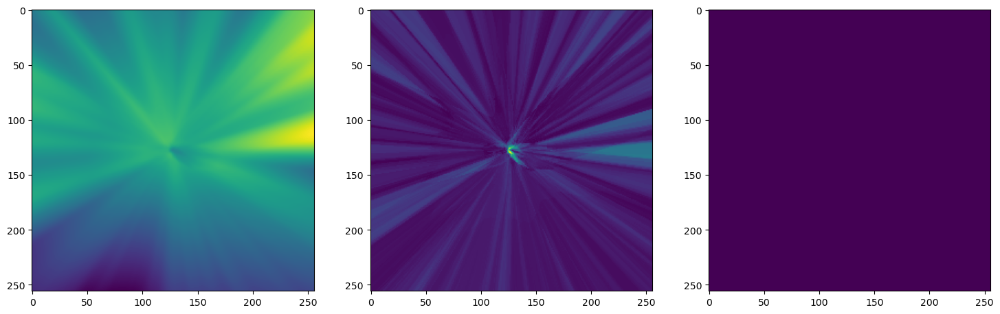

Step 450, Total loss 0.078569


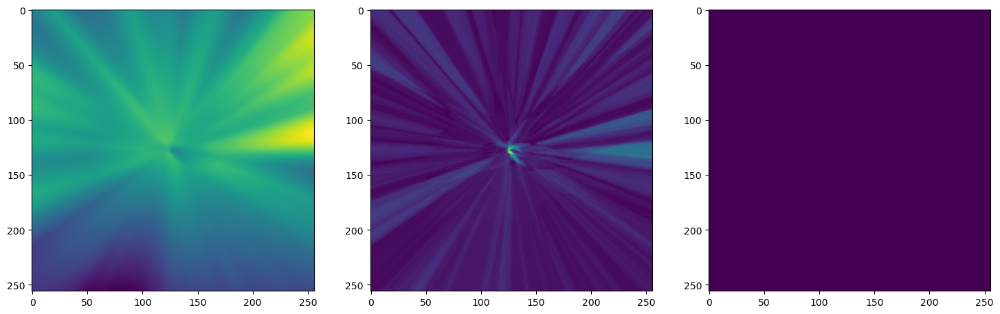

Step 460, Total loss 0.077975


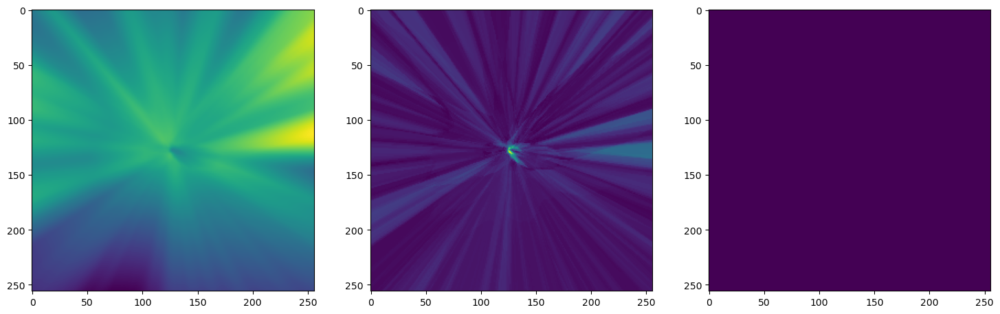

Step 470, Total loss 0.077281


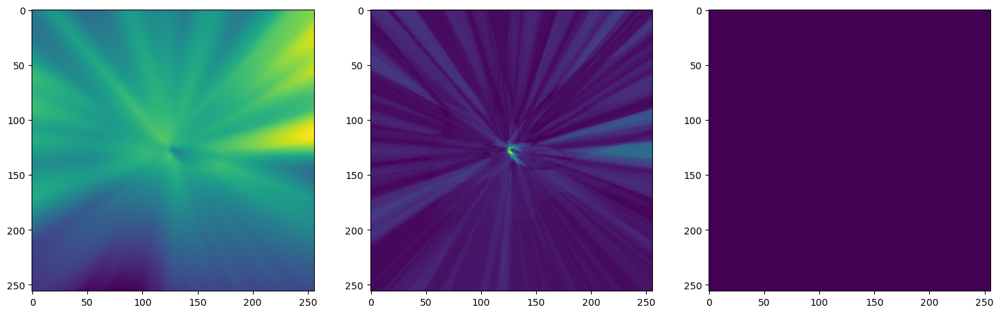

Step 480, Total loss 0.076525


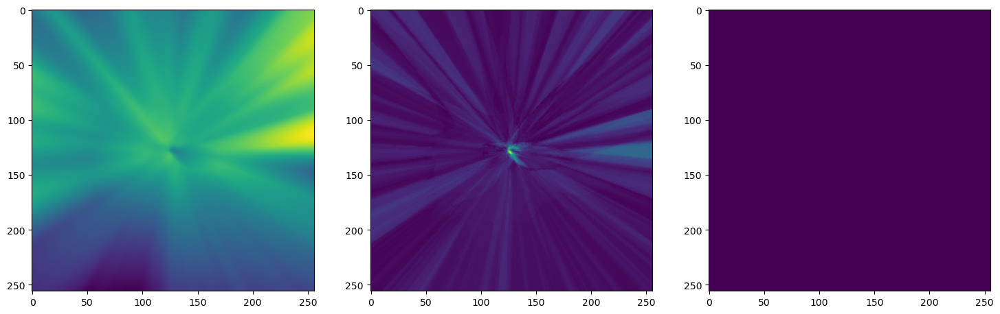

Step 490, Total loss 0.075730


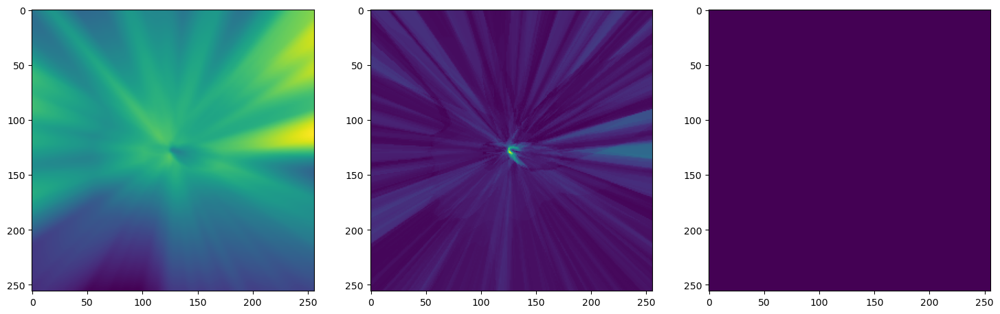

CPU times: user 24.5 s, sys: 249 ms, total: 24.7 s
Wall time: 23.9 s


In [8]:
%%time

total_steps = 500
steps_til_summary = 10

optim = torch.optim.Adam(lr=1e-4, params=img_relu.parameters())

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.cuda(), ground_truth.cuda()

for step in range(total_steps):
    model_output, coords = img_relu(model_input)   # <-- only change is the model name
    loss = ((model_output - ground_truth)**2).mean()

    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy())
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()
